In [1]:
from collections import Counter
import gzip
import pathlib

import torch
import pandas as pd
import scipy
import numpy as np

import scanpy as sc
import anndata as ad
import gseapy

import seaborn as sns
import matplotlib.pyplot as plt

import flipcrow
import flipcrow.paths
import flipcrow.scp1644_mothership as mship

mps_device = torch.device("mps")

# sc.settings.verbosity = 0
import warnings
warnings.filterwarnings("ignore")

sc.set_figure_params(figsize=(10, 10))
pd.options.display.width=400

%matplotlib inline

1.10.0rc2


In [8]:
def pseudobulk_leiden(single_cell_data: ad.AnnData) -> ad.AnnData:
    clust_id_buf = []
    clust_pb_buf = []
    clust_pb_n_cells_buf = []
    for clust_id in sorted(map(int, single_cell_data.obs.leiden.unique())):
        clust_id_buf.append(str(clust_id))
        clust_pb_buf.append(single_cell_data[single_cell_data.obs.leiden == str(clust_id), :].layers['trimmed_counts'].sum(axis=0))
        clust_pb_n_cells_buf.append(len(single_cell_data[single_cell_data.obs.leiden == str(clust_id), :]))
    
    adpb = ad.AnnData(pd.DataFrame(clust_pb_buf, index=clust_id_buf, columns=single_cell_data.var_names))
    adpb.obs['leiden'] = pd.Categorical(clust_id_buf)
    adpb.obs['n_cells'] = np.array(clust_pb_n_cells_buf)
    # print(adpb)
    
    adpb.var['mt'] = adpb.var_names.str.startswith(("MT-"))
    sc.pp.calculate_qc_metrics(
        adpb, 
        qc_vars=["mt"], #, "ribo", "hb"], 
        inplace=True, 
        percent_top=[20], 
        log1p=False,
    )
    
    adpb.layers['trimmed_counts'] = adpb.to_df().loc[adpb.obs_names, :]
    # sc.pp.scrublet(adpb_all)
    sc.pp.normalize_total(adpb, target_sum=10000, inplace=True)
    sc.pp.log1p(adpb, copy=False)
    
    return adpb


In [3]:
scp1644_raw = flipcrow.scp1644_mothership.load_scp1644_data(check_metadata=True)

24.97741413116455
Checking metadata!
Biosample IDs
Counter({'PANFR0489R_Biopsy_None': 2344, 'PANFR0592_Biopsy_None': 2103, 'PANFR0557_Biopsy_None': 1863, 'PANFR0473_Biopsy_None': 1370, 'PANFR0545_Biopsy_None': 1318, 'PANFR0604_Biopsy_None': 1277, 'PANFR0580_Biopsy_None': 1243, 'PANFR0593_Biopsy_None': 1170, 'PANFR0562_Biopsy_None': 1140, 'PANFR0552_Biopsy_None': 1112, 'PANFR0576_Biopsy_None': 1011, 'PANFR0383_Biopsy_None': 1008, 'PANFR0635_Biopsy_None': 964, 'PANFR0575_Biopsy_None': 867, 'PANFR0637_Biopsy_None': 862, 'PANFR0605_Biopsy_None': 848, 'PANFR0598_Biopsy_None': 792, 'PANFR0631_Biopsy_None': 789, 'PANFR0578_Biopsy_None': 659, 'PANFR0543_Biopsy_None': 620, 'PANFR0583_Biopsy_None': 492, 'PANFR0526_Biopsy_None': 262, 'PANFR0489_Biopsy_None': 213, 'PANFR0588_Biopsy_None': 85})
Cell tags
Counter({'Biopsy_PANFR0489': 2557, 'Biopsy_PANFR0592': 2103, 'Biopsy_PANFR0557': 1863, 'Biopsy_PANFR0473': 1370, 'Biopsy_PANFR0545': 1318, 'Biopsy_PANFR0604': 1277, 'Biopsy_PANFR0580': 1243, 'Biops

In [4]:
scp1644_trim = flipcrow.scp1644_mothership.preprocess_scp1644_data(scp1644_raw)


Per chunk QC
Concatenate
PANFR0489_Biopsy_None : (207, 16814)
PANFR0576_Biopsy_None : (1011, 16814)
PANFR0593_Biopsy_None : (1170, 16814)
PANFR0545_Biopsy_None : (1318, 16814)
PANFR0592_Biopsy_None : (2102, 16814)
PANFR0526_Biopsy_None : (257, 16814)
PANFR0543_Biopsy_None : (618, 16814)
PANFR0575_Biopsy_None : (866, 16814)
PANFR0473_Biopsy_None : (1362, 16814)
PANFR0635_Biopsy_None : (964, 16814)
PANFR0562_Biopsy_None : (1139, 16814)
PANFR0578_Biopsy_None : (659, 16814)
PANFR0557_Biopsy_None : (1858, 16814)
PANFR0580_Biopsy_None : (1243, 16814)
PANFR0637_Biopsy_None : (862, 16814)
PANFR0588_Biopsy_None : (81, 16814)
PANFR0598_Biopsy_None : (792, 16814)
PANFR0383_Biopsy_None : (990, 16814)
PANFR0583_Biopsy_None : (492, 16814)
PANFR0489R_Biopsy_None : (2340, 16814)
PANFR0552_Biopsy_None : (1107, 16814)
PANFR0604_Biopsy_None : (1277, 16814)
PANFR0605_Biopsy_None : (848, 16814)
PANFR0631_Biopsy_None : (789, 16814)

Merged QC


In [2]:
savepoint = 'scp1644_trim_savepoint.h5ad'
# scp1644_trim.write_h5ad(str(flipcrow.paths.DATA_PATH / "SCP1644" / savepoint))
scp1644_trim = ad.read_h5ad(str(flipcrow.paths.DATA_PATH / "SCP1644" / savepoint))

In [3]:
print(scp1644_trim[scp1644_trim.obs['Coarse_Cell_Annotations'] == 'Tumor'])
print(scp1644_trim[scp1644_trim.obs['Coarse_Cell_Annotations'] != 'Tumor'])

View of AnnData object with n_obs × n_vars = 7875 × 16605
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells'
    uns: 'log1p'
    layers: 'trimmed_counts'
View of AnnData object with n_obs × n_vars = 16476 × 16605
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__onto

In [4]:
print("HVG / PCA / NN / Leiden / UMAP / tSNE")
sc.pp.highly_variable_genes(scp1644_trim, flavor="seurat", n_top_genes=1070)
sc.pp.pca(scp1644_trim)
sc.pp.neighbors(scp1644_trim, n_neighbors=40, n_pcs=50)
sc.tl.leiden(scp1644_trim)
sc.tl.umap(scp1644_trim)
sc.tl.tsne(scp1644_trim)

print("HVG / Rank genes groups")
sc.tl.rank_genes_groups(scp1644_trim, 'leiden', method='wilcoxon')

HVG / PCA / NN / Leiden / UMAP / tSNE
HVG / Rank genes groups


In [9]:
adpb_trim = pseudobulk_leiden(scp1644_trim)

In [103]:
# clust_id_buf = []
# clust_pb_buf = []
# clust_pb_n_cells_buf = []
# for clust_id in sorted(map(int, scp1644_trim.obs.leiden.unique())):
#     clust_id_buf.append(clust_id)
#     clust_pb_buf.append(scp1644_trim[scp1644_trim.obs.leiden == str(clust_id), :].layers['trimmed_counts'].sum(axis=0))
#     clust_pb_n_cells_buf.append(len(scp1644_trim[scp1644_trim.obs.leiden == str(clust_id), :]))

# adpb = ad.AnnData(pd.DataFrame(clust_pb_buf, index=clust_id_buf, columns=scp1644_trim.var_names))
# adpb.obs['leiden'] = clust_id_buf
# adpb.obs['n_cells'] = np.array(clust_pb_n_cells_buf)
# # print(adpb)

# adpb.var['mt'] = adpb.var_names.str.startswith(("MT-"))
# sc.pp.calculate_qc_metrics(
#     adpb, 
#     qc_vars=["mt"], #, "ribo", "hb"], 
#     inplace=True, 
#     percent_top=[20], 
#     log1p=False,
# )

# adpb.layers['trimmed_counts'] = adpb.to_df().loc[adpb.obs_names, :]
# # sc.pp.scrublet(adpb_all)
# sc.pp.normalize_total(adpb, target_sum=10000, inplace=True)
# sc.pp.log1p(adpb, copy=False)

In [10]:
for clust_id in sorted(map(int, scp1644_trim.obs.leiden.unique())):
    print(clust_id, Counter(scp1644_trim[scp1644_trim.obs.leiden == str(clust_id), :].obs['Coarse_Cell_Annotations']))

0 Counter({'Macrophage': 2384, 'DC': 55, 'Endothelial': 21, 'T_NK': 10, 'T_Regs': 4, 'Hepatocyte': 3, 'pDC_cell': 2, 'Mesenchymal': 2, 'XCR1_DC': 1, 'Tumor': 1, 'B_Cells': 1, 'Plasma_cell': 1})
1 Counter({'Macrophage': 2440, 'DC': 19, 'T_NK': 9, 'T_Regs': 3, 'Plasma_cell': 2, 'B_Cells': 2, 'Mesenchymal': 1, 'Hepatocyte': 1, 'Tumor': 1, 'Endothelial': 1})
2 Counter({'T_NK': 2328, 'T_Regs': 15, 'Tumor': 7, 'Macrophage': 6, 'Hepatocyte': 3, 'B_Cells': 3, 'pDC_cell': 2, 'DC': 1, 'Plasma_cell': 1, 'Mesenchymal': 1, 'Endothelial': 1, 'XCR1_DC': 1})
3 Counter({'T_NK': 2041, 'Macrophage': 25, 'T_Regs': 24, 'Tumor': 13, 'Endothelial': 9, 'Mesenchymal': 9, 'Hepatocyte': 3, 'DC': 3, 'B_Cells': 2, 'Plasma_cell': 1, 'pDC_cell': 1})
4 Counter({'Tumor': 1053, 'Macrophage': 16, 'Hepatocyte': 1, 'T_NK': 1})
5 Counter({'T_NK': 990, 'T_Regs': 7, 'Endothelial': 7, 'Hepatocyte': 5, 'Plasma_cell': 1, 'Mesenchymal': 1})
6 Counter({'Tumor': 1007, 'T_NK': 1})
7 Counter({'DC': 684, 'XCR1_DC': 156, 'T_NK': 73, '

In [11]:
with pd.option_context('display.width', 200):
    print(adpb_trim.obs.sort_values('pct_counts_mt'))

   leiden  n_cells  n_genes_by_counts  total_counts  pct_counts_in_top_20_genes  total_counts_mt  pct_counts_mt
4       4     1071              16004    10169970.0                   10.201348         367368.0       3.612282
24     24      310              13902     2687633.0                   14.590720         172273.0       6.409841
1       1     2479              16389    22921862.0                   14.709525        1543663.0       6.734457
10     10      708              16052     6236659.0                   14.455111         426339.0       6.836016
25     25      272              13628     1546575.0                   11.613792         108418.0       7.010200
32     32       57              12184      539709.0                   16.260800          37946.0       7.030826
17     17      525              15427     4820876.0                   12.170361         341349.0       7.080643
16     16      546              14960     6190727.0                   11.123072         452339.0       7

In [13]:
sc.pl.rank_genes_groups(scp1644_trim, sharey=False, swap=True)

In [22]:
# remove cluster 32 for significant mitochondrial content
scp1644_filter = scp1644_trim[[x not in {'29'} for x in scp1644_trim.obs.leiden], :]



In [23]:
print(scp1644_trim[scp1644_trim.obs['Coarse_Cell_Annotations'] == 'Tumor', :].shape)
print(scp1644_trim[scp1644_trim.obs['Coarse_Cell_Annotations'] != 'Tumor', :].shape)

print(scp1644_filter[scp1644_filter.obs['Coarse_Cell_Annotations'] == 'Tumor', :].shape)
print(scp1644_filter[scp1644_filter.obs['Coarse_Cell_Annotations'] != 'Tumor', :].shape)


(7875, 16605)
(16476, 16605)
(7671, 16605)
(16476, 16605)


In [51]:
# ## Test doublet filtering based on scrublet. Skip doublet filtering for now

# doublet_cutoff = 0.2

# for clust_id in scp1644_trim[scp1644_trim.obs.doublet_score > doublet_cutoff].obs.leiden.unique():
#     print(clust_id)
#     print(Counter(scp1644_trim[scp1644_trim.obs.leiden==clust_id].obs['Coarse_Cell_Annotations']))
#     print(Counter(scp1644_trim[np.logical_and(scp1644_trim.obs.doublet_score > doublet_cutoff, scp1644_trim.obs.leiden==clust_id)].obs['Coarse_Cell_Annotations']))
#     print()

In [24]:
## reprocess scp1644_filter

print("HVG / PCA / kNN")
sc.pp.highly_variable_genes(scp1644_filter, flavor="seurat", n_top_genes=1070)
sc.pp.pca(scp1644_filter)
sc.pp.neighbors(scp1644_filter, n_neighbors=40, n_pcs=50)


HVG / PCA / kNN


In [46]:
print("Leiden / tSNE")
sc.tl.leiden(scp1644_filter, resolution=3.0)
sc.tl.umap(scp1644_filter)
sc.tl.tsne(scp1644_filter)

Leiden / tSNE


In [47]:
print("HVG + Rank genes groups")
sc.tl.rank_genes_groups(scp1644_filter, 'leiden')

HVG + Rank genes groups


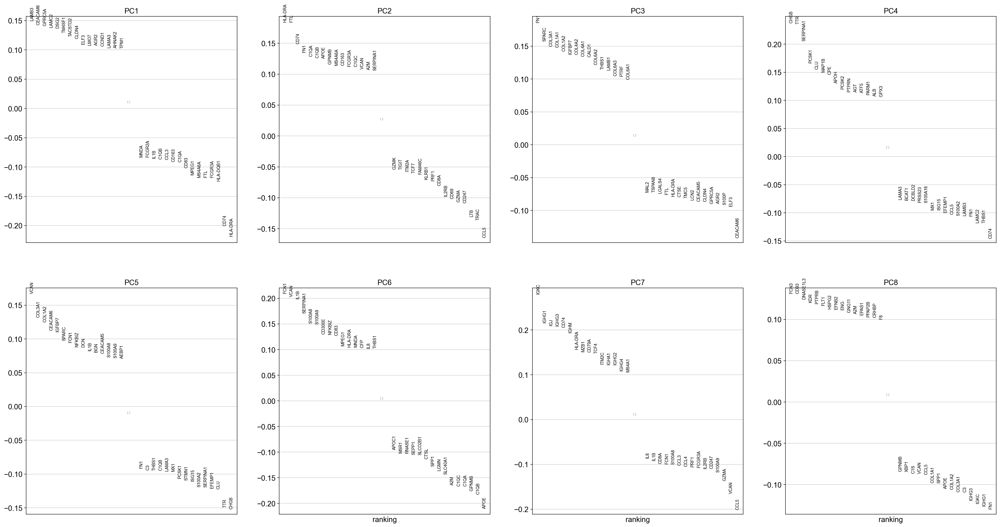

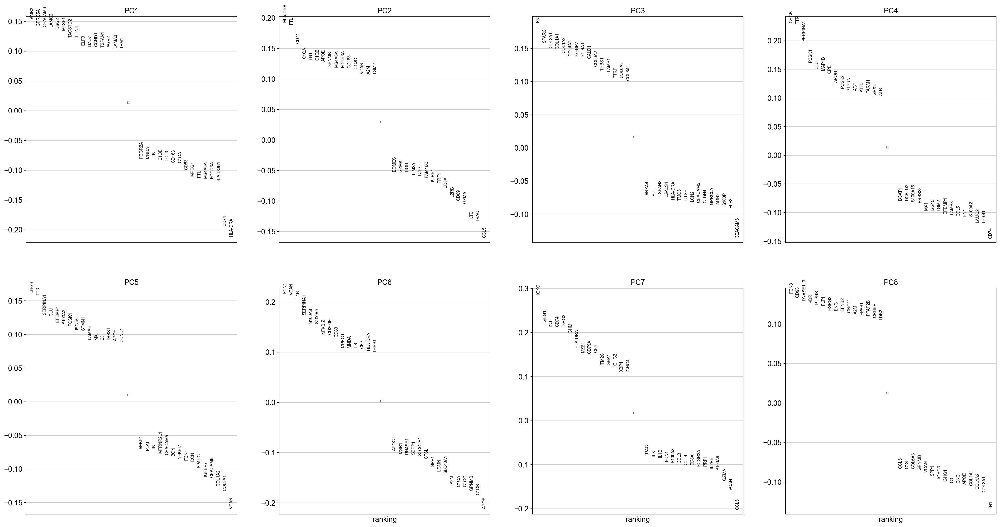

In [48]:
## Removal of cluster 32 removes mitochondrial content in PC3
sc.set_figure_params(figsize=(8, 8))

sc.pl.pca_loadings(scp1644_trim, components='1,2,3,4,5,6,7,8')
sc.pl.pca_loadings(scp1644_filter, components='1,2,3,4,5,6,7,8')

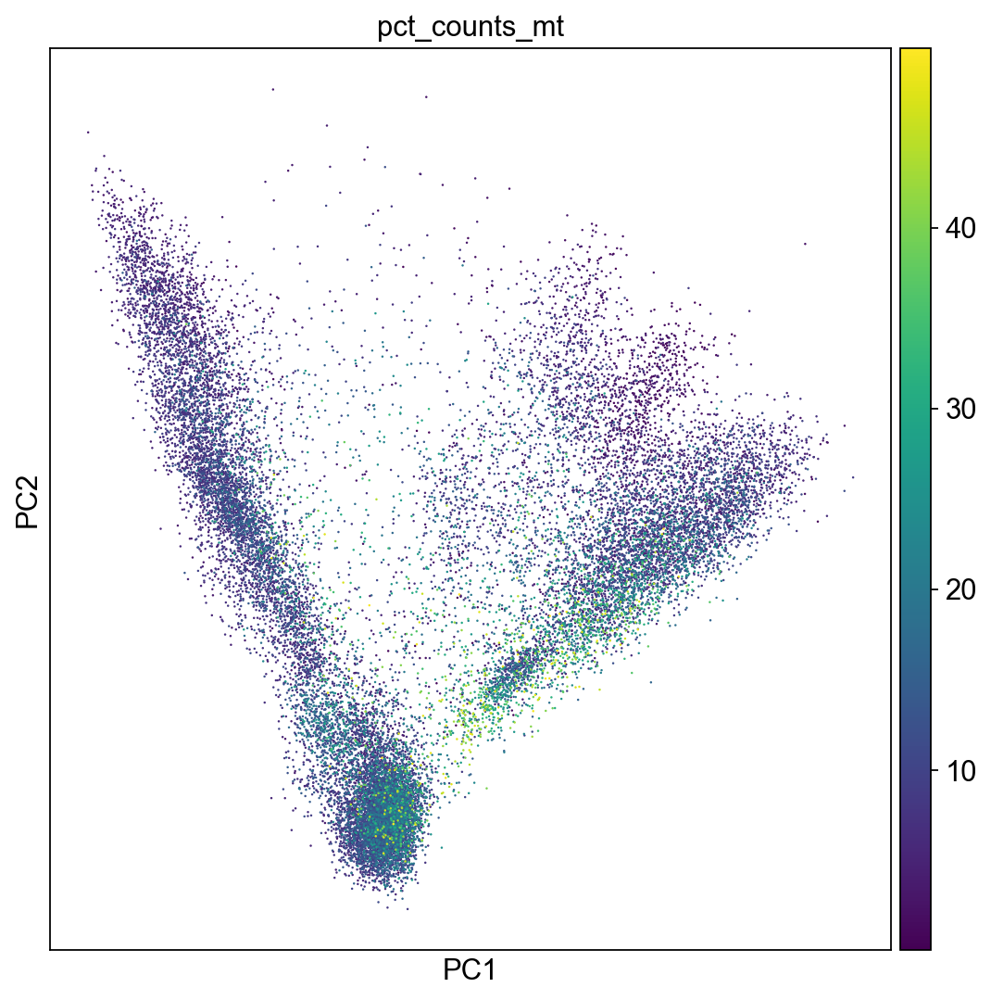

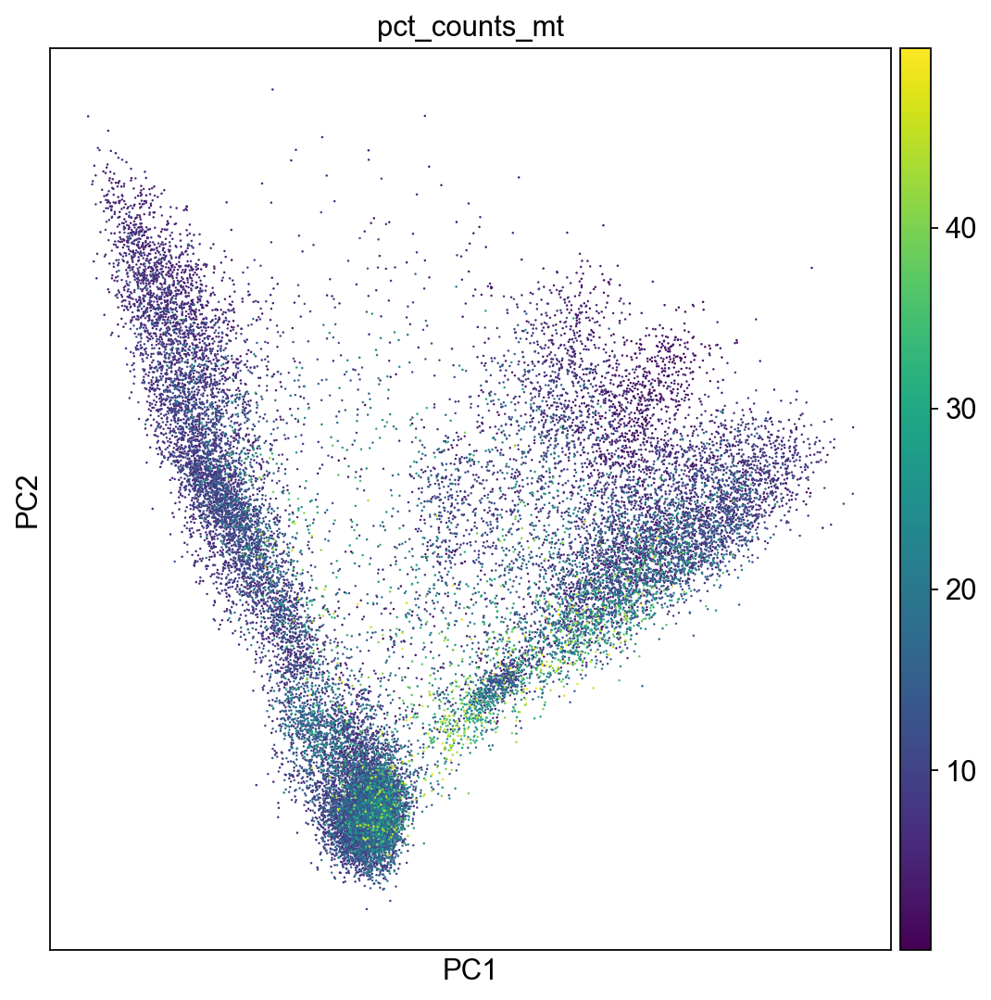

In [49]:
sc.pl.pca(scp1644_trim, color='pct_counts_mt')
sc.pl.pca(scp1644_filter, color='pct_counts_mt')

In [50]:
normal_markers = pd.read_excel(flipcrow.paths.DATA_PATH / "markergenes" / "mmc2.xlsx", header=4, dtype=object)
normal_markers = normal_markers.iloc[:, 2:]
normal_markers = normal_markers.loc[:, ['Gene', 'myAUC', 'avg_diff', 'power', 'avg_logFC', 'pct.1', 'pct.2', 'cell.type']]
normal_markers_dict = {}

# filter datetime oddities found in original data probably caused by entering MARCH1, MARCH11 etc in dataset. This is (possibly?) auto converted to 11-Mar, 1-Mar, etc 
for grpid, grp in normal_markers.groupby('cell.type'):
    normal_markers_dict[grpid] = [grp.loc[idx, 'Gene'] for idx in grp.index if type(grp.loc[idx, 'Gene']) == str and float(grp.loc[idx, 'power']) >= 0.6]

#print(normal_markers_dict)
markers_dict = normal_markers_dict.copy()

# markers_dict['mt_genes'] = [x for x in scp1644_trim.var_names if x.startswith('MT-')]

markers_dict['NET_markers'] = [
    'TTR',
    'CHGB',
]

markers_dict['Tumor_keratins'] = [
    'KRT5',
    'KRT6A',
    'KRT6B',
    'KRT7',
    'KRT8', 
    'KRT10',
    'KRT13',
    'KRT14',
    'KRT15',
    'KRT16',
    'KRT17',
    'KRT18',
    'KRT19',
    'KRT23',
]

moffitt_pdac = {
    'Basal': [
        'VGLL1', 
        'UCA1', 
        'S100A2', 
        'LY6D', 
        'SPRR3',
        'SPRR1B',
        'LEMD1',
        'KRT15',
        'CTSV', # 'CTSL2',
        'DHRS9',
        'AREG',
        'CST6',
        'SERPINB3',
        # 'KRT6C', # not present in var_names
        'KRT6A',
        'FAM83A',
        'SCEL',
        'FGFBP1',
        'KRT7',
        'KRT17',
        'GPR87',
        'TNS4',
        'SLC2A1',
        'ANXA8L2',
    ],
    'Classical': [
        'BTNL8',
        'FAM3D',
        'PRR15L', # 'ATAD4',
        'AGR3',
        'CTSE',
        # 'TMEM238L', # 'LOC400573', not present in genes
        # 'LYZ', # common in T cells
        'TFF2',
        'TFF1',
        'ANXA10',
        'LGALS4',
        'PLA2G10',
        'CEACAM6',
        'VSIG2',
        'TSPAN8',
        'ST6GALNAC1',
        'AGR2',
        'TFF3',
        'CYP3A7',
        'MYO1A',
        'CLRN3',
        'KRT20',
        'CDH17',
        'SPINK4',
        'REG4',
    ],
}

# tumor_keratins = {
#     'Tumor_keratins': [
#         'KRT5',
#         'KRT7',
#         'KRT8', 
#         'KRT10',
#         'KRT13',
#         'KRT14',
#         'KRT17',
#         'KRT18',
#         'KRT19',
#     ]
# }



In [51]:
# sc.pl.heatmap(scp1644_trim, markers_dict, 'leiden', standard_scale='var', figsize=(20,20))

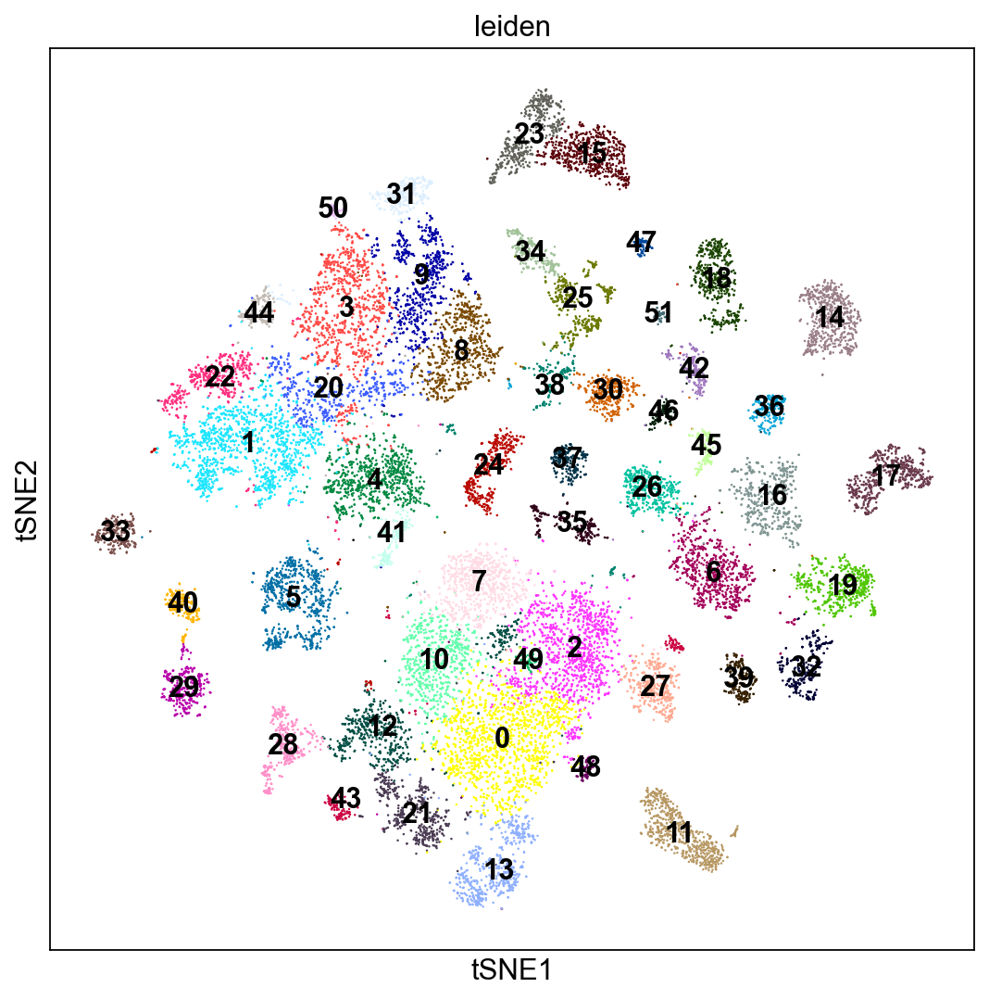

In [52]:
sc.pl.tsne(scp1644_filter, color='leiden', legend_loc="on data")

categories: 0, 1, 2, etc.
var_group_labels: B_Cells, DC, Endothelial, etc.


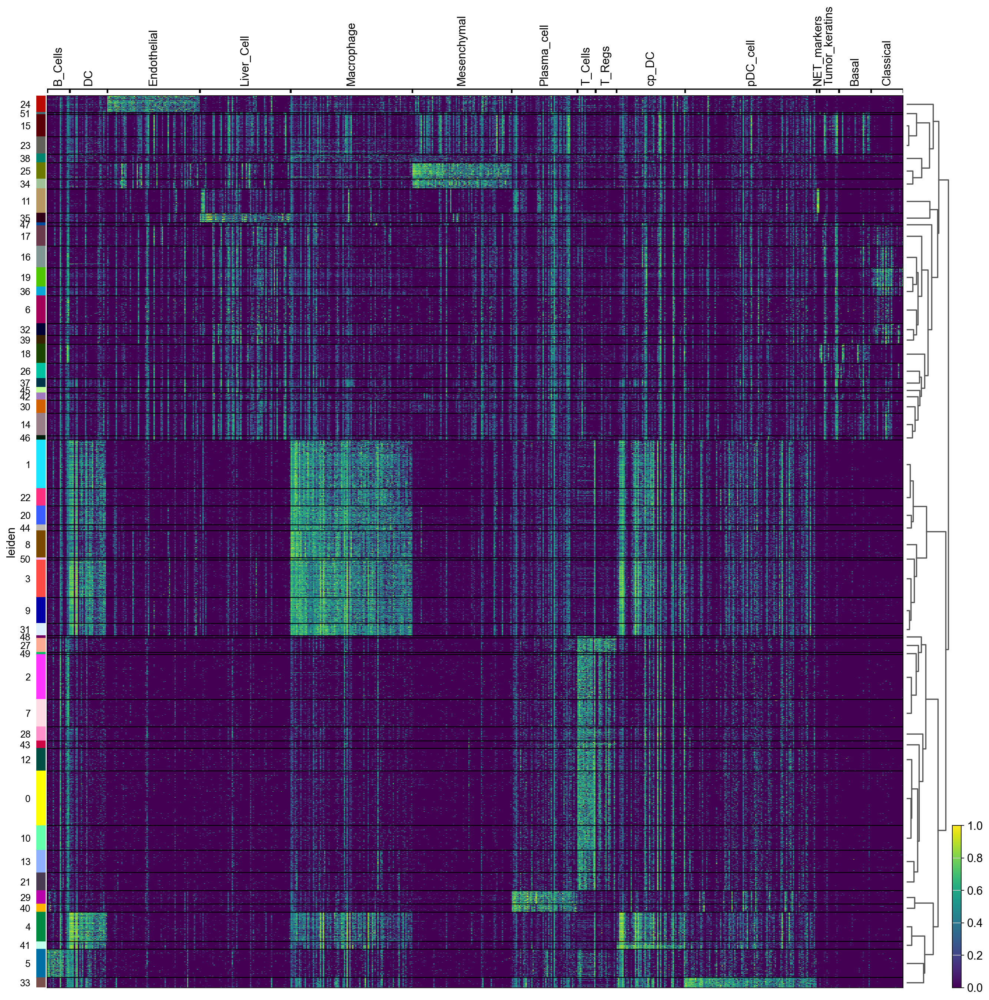

In [53]:
# Make large leiden-based heatmap of the markers dict (Table 2)
sc.tl.dendrogram(scp1644_filter, 'leiden')
markers_dict.update(moffitt_pdac)
# sc.pl.heatmap(scp1644_trim, markers_dict, 'leiden', layer='scale', figsize=(20, 20))
sc.pl.heatmap(scp1644_filter, markers_dict, 'leiden', standard_scale='var', figsize=(20, 20), dendrogram=True)
# sc.pl.heatmap(scp1644_trim, markers_dict, 'leiden', standard_scale='obs', figsize=(20, 20), dendrogram=True, vmin=0, vmax=1)

# sc.pl.heatmap(scp1644_trim, markers_dict, 'leiden', standard_scale='obs', figsize=(20, 20))



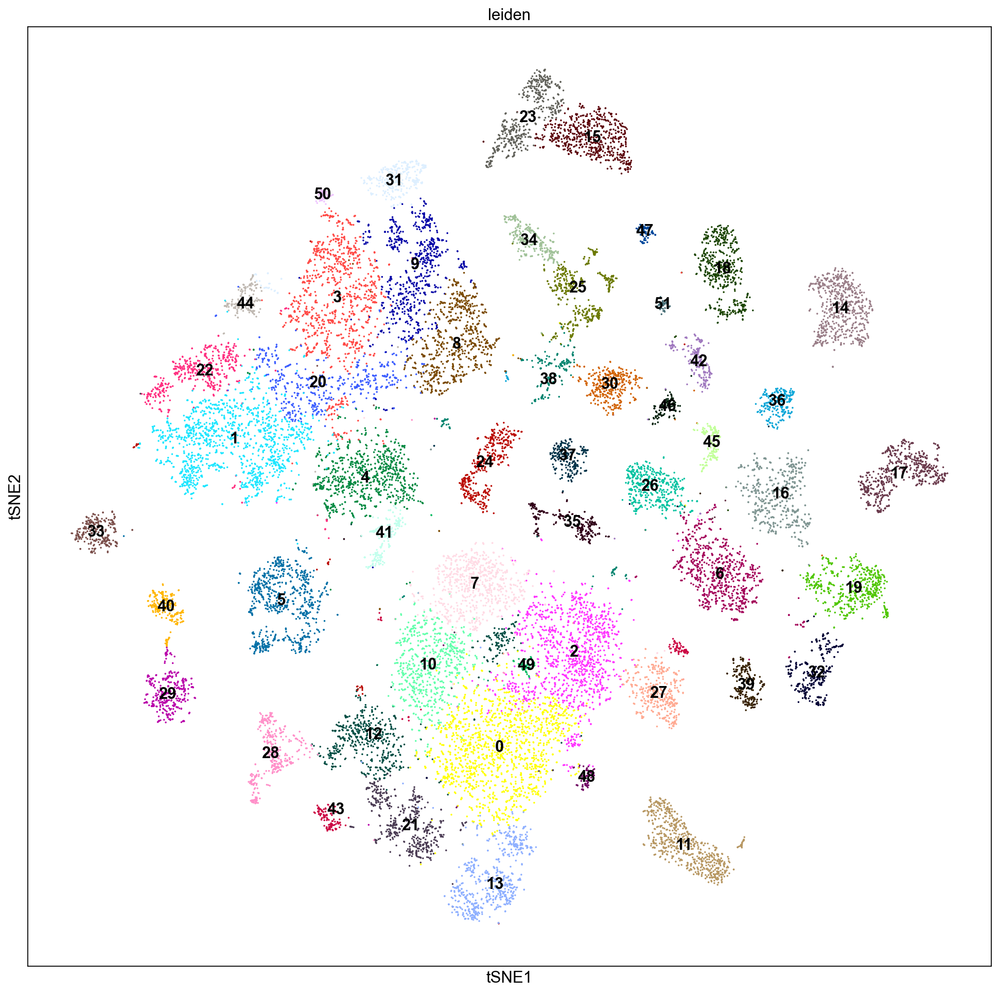

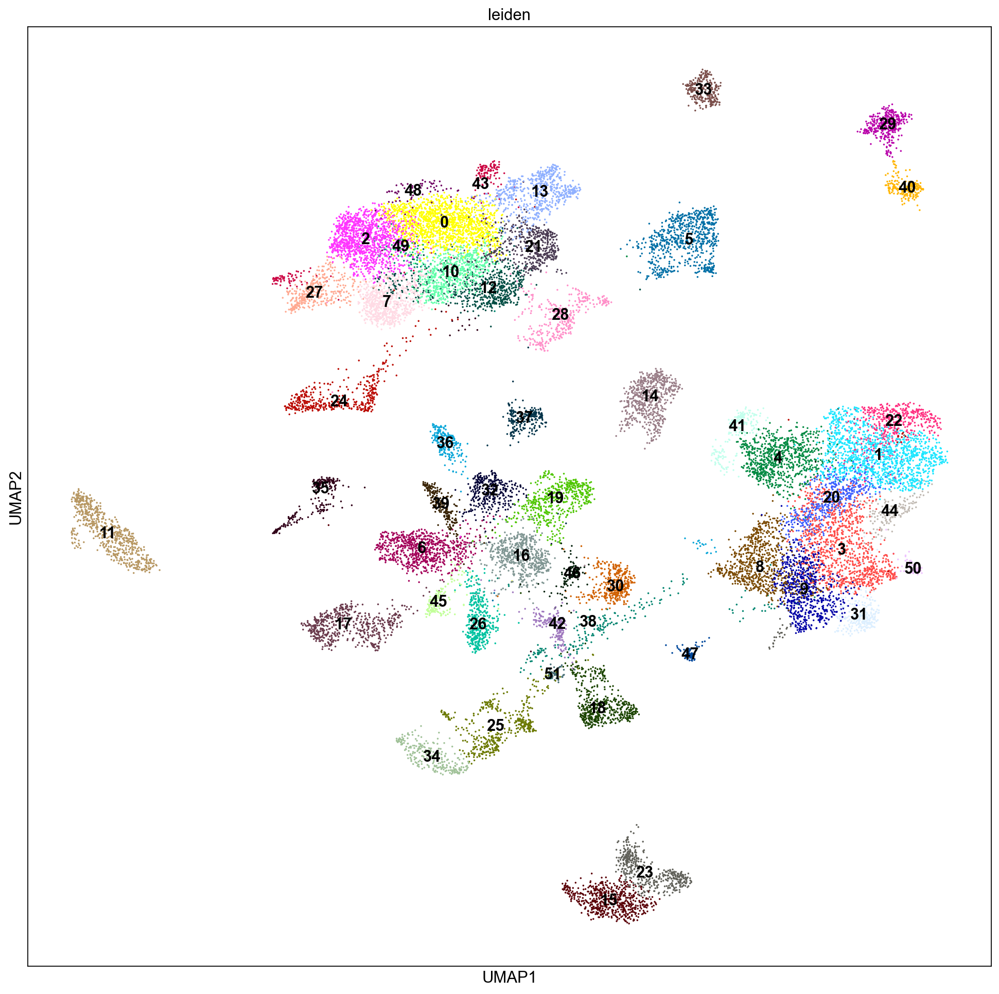

In [54]:
sc.set_figure_params(figsize=(15, 15))

sc.pl.tsne(scp1644_filter, color='leiden', legend_loc="on data", size=10)
sc.pl.umap(scp1644_filter, color='leiden', legend_loc="on data", size=10)

In [55]:
## "pseudobulk" clusters to simplify clustering

single_cell_data = scp1644_filter

adpb_filter = pseudobulk_leiden(scp1644_filter)

In [56]:
print(adpb_filter)
for k, v in markers_dict.items():
    sc.tl.score_genes(adpb_filter, v, ctrl_size=100, score_name=f"score_{k}")

AnnData object with n_obs × n_vars = 52 × 16605
    obs: 'leiden', 'n_cells', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'trimmed_counts'


In [57]:
print("Dimensionality reduction and clustering")
sc.pp.highly_variable_genes(adpb_filter, flavor="seurat", n_top_genes=1070)
sc.pp.pca(adpb_filter)
sc.pp.neighbors(adpb_filter) #, n_neighbors=40, n_pcs=50)
# sc.tl.leiden(adpb)
# sc.tl.umap(adpb_filter)
# sc.tl.tsne(adpb_filter)

Dimensionality reduction and clustering


categories: 0, 1, 10, etc.
var_group_labels: B_Cells, DC, Endothelial, etc.


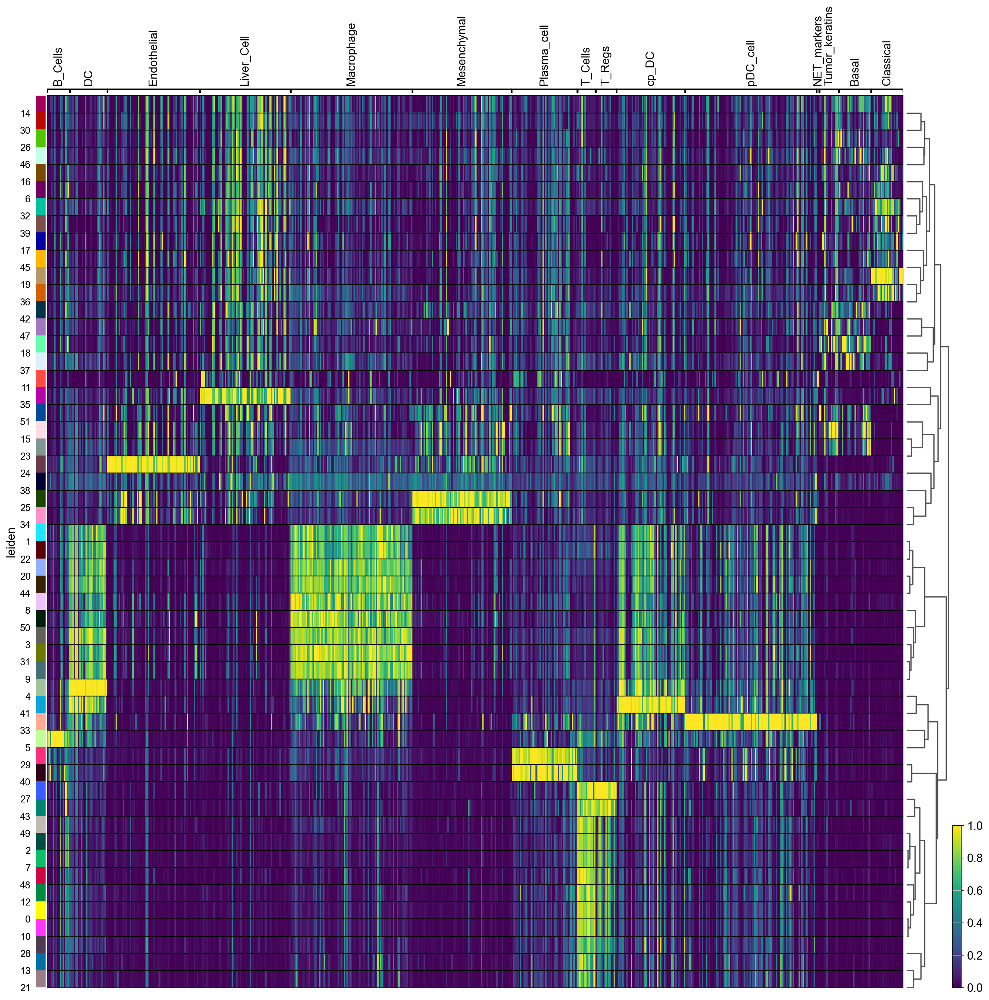

In [58]:
sc.tl.dendrogram(adpb_filter, 'leiden')
sc.pl.heatmap(adpb_filter, markers_dict, 'leiden', standard_scale='var', figsize=(20,20), dendrogram=True)

In [59]:
print(adpb_filter.obs.loc[:, ['score_Tumor_keratins', 'score_Basal', 'score_Classical']].sort_values('score_Tumor_keratins'))
adpb_filter.obs['tumor_eval'] = (adpb_filter.obs.score_Tumor_keratins > 0.) & ((adpb_filter.obs.score_Basal > 0.) | (adpb_filter.obs.score_Classical > 0.))
# print(adpb_filter.obs.tumor_eval)
for idx in adpb_filter.obs.index:
    print(idx, adpb_filter.obs.loc[idx, 'tumor_eval'], Counter(scp1644_filter[scp1644_filter.obs.leiden==str(idx)].obs['Coarse_Cell_Annotations']))
    

    score_Tumor_keratins  score_Basal  score_Classical
41             -0.376918    -0.254093        -0.205627
1              -0.374969    -0.263951        -0.201944
7              -0.373710    -0.259621        -0.196003
24             -0.372757    -0.293445        -0.199664
31             -0.370719    -0.256022        -0.220503
21             -0.369515    -0.268981        -0.197119
44             -0.367087    -0.239464        -0.206959
4              -0.366960    -0.249053        -0.192534
28             -0.365687    -0.277232        -0.218796
13             -0.365148    -0.253424        -0.196859
3              -0.364913    -0.251384        -0.212750
27             -0.363427    -0.283156        -0.201753
10             -0.359726    -0.251180        -0.198857
20             -0.355989    -0.240145        -0.188644
0              -0.350575    -0.259615        -0.187971
48             -0.345375    -0.237350        -0.201170
8              -0.344486    -0.218345        -0.162650
2         

In [60]:
# print(adpb_filter.obs.loc[:, ['score_T_Cells', 'score_T_Regs', 'score_B_Cells', 'score_Macrophage', 'score_Plasma_cell']].sort_values('score_T_Cells'))
# print()

local_cell_annot = {}
for idx in adpb_filter.obs.index:
    
    # print(adpb_filter.obs.loc[[idx], [x for x in adpb_filter.obs.columns if x.startswith('score')]])
    print(adpb_filter.obs.loc[idx, [x for x in adpb_filter.obs.columns if x.startswith('score')]].T.sort_values())
    print(Counter(scp1644_filter[scp1644_filter.obs.leiden==str(idx)].obs['Coarse_Cell_Annotations']))
    print()
    if adpb_filter.obs.loc[idx, 'tumor_eval']:
        local_cell_annot[idx] = 'Tumor'
    else:
        local_cell_annot[idx] = adpb_filter.obs.loc[idx, [x for x in adpb_filter.obs.columns if x.startswith('score')]].T.sort_values().index[-1].removeprefix('score_')
        


score_Tumor_keratins   -0.350575
score_Mesenchymal      -0.326372
score_Liver_Cell       -0.272733
score_Basal            -0.259615
score_Endothelial      -0.259383
score_Macrophage       -0.213679
score_Classical        -0.187971
score_NET_markers       0.012914
score_DC                0.071804
score_pDC_cell          0.099237
score_Plasma_cell       0.236917
score_cp_DC             0.339792
score_B_Cells           0.412611
score_T_Regs            0.688884
score_T_Cells           1.644395
Name: 0, dtype: object
Counter({'T_NK': 1450, 'T_Regs': 7, 'Tumor': 5, 'Macrophage': 4, 'Hepatocyte': 2, 'pDC_cell': 2, 'B_Cells': 2, 'DC': 1, 'Mesenchymal': 1, 'Endothelial': 1})

score_Tumor_keratins   -0.374969
score_Mesenchymal      -0.279082
score_Basal            -0.263951
score_Liver_Cell       -0.263364
score_Endothelial      -0.210557
score_Classical        -0.201944
score_T_Regs           -0.195927
score_T_Cells          -0.173346
score_NET_markers       -0.07668
score_Plasma_cell       0.2

In [61]:
marker_replace_dict = {
    'T_Cells': 'T_NK',
    'Macrophage': 'Macrophage',
    'Tumor_keratins': 'Tumor',
    'Basal': 'Tumor',
    'Classical': 'Tumor',
    'B_Cells': 'B_Cells',
    'DC': 'DC',
    'Mesenchymal': 'Mesenchymal',
    'Liver_Cell': 'Hepatocyte',
    'Plasma_cell': 'Plasma_cell',
    'T_Regs': 'T_Regs',
    'Endothelial': 'Endothelial',
    'pDC_cell': 'pDC_cell',
    'cp_DC': 'XCR1_DC',
    'NET_markers': 'Tumor',
    'Tumor': 'Tumor',
}

In [62]:
scp1644_filter.obs['local_cell_annot'] = None
for clust_id in scp1644_filter.obs.leiden.unique():
    try:
        scp1644_filter.obs.loc[scp1644_filter.obs.leiden == clust_id, 'local_cell_annot'] = marker_replace_dict[local_cell_annot[clust_id]]
    except KeyError:
        print(clust_id)
        print(local_cell_annot[clust_id])
        raise

In [63]:
print(scp1644_filter.obs.local_cell_annot)

Biopsy_PANFR0489_T1_AAACAAATCCGA          Tumor
Biopsy_PANFR0489_T1_AACCGAGAGTCC          Tumor
Biopsy_PANFR0489_T1_AACCGTACCATG          Tumor
Biopsy_PANFR0489_T1_AAGCGAGAGCTG          Tumor
Biopsy_PANFR0489_T1_AAGGGTAGCCCT          Tumor
                                       ...     
Biopsy_PANFR0631_T1_TTTGGAGCGCCT        XCR1_DC
Biopsy_PANFR0631_T1_TTTGGTATCTCC     Macrophage
Biopsy_PANFR0631_T1_TTTGTTTCGTCC          Tumor
Biopsy_PANFR0631_T1_TTTTCAACCGGT    Mesenchymal
Biopsy_PANFR0631_T1_TTTTCCCCGCAT     Macrophage
Name: local_cell_annot, Length: 24147, dtype: object


In [64]:
print(sum(scp1644_filter.obs['Coarse_Cell_Annotations'] == scp1644_filter.obs.local_cell_annot))
print(sum(scp1644_filter.obs['Coarse_Cell_Annotations'] == scp1644_filter.obs.local_cell_annot)/len(scp1644_filter))

22320
0.9243384271338054


In [65]:
sc.pl.rank_genes_groups(scp1644_filter, n=30, sharey=False)

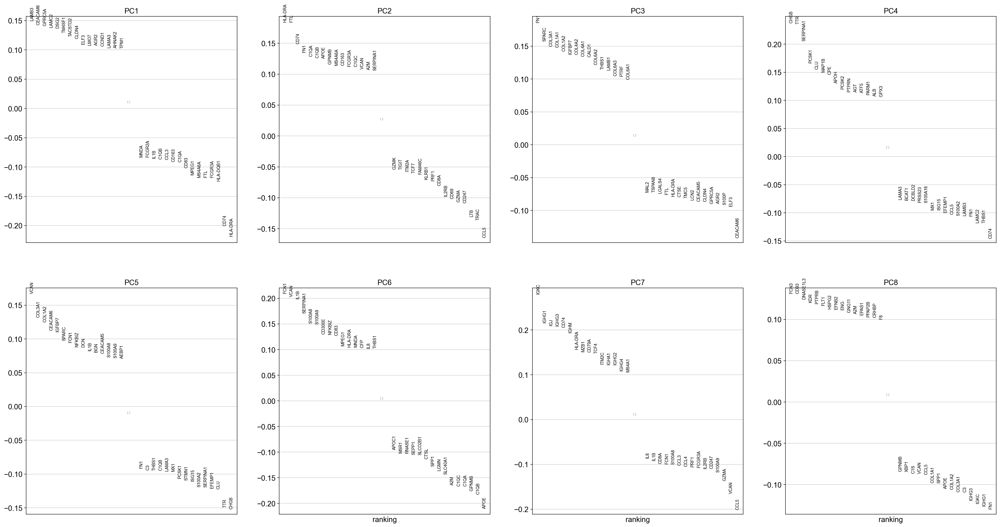

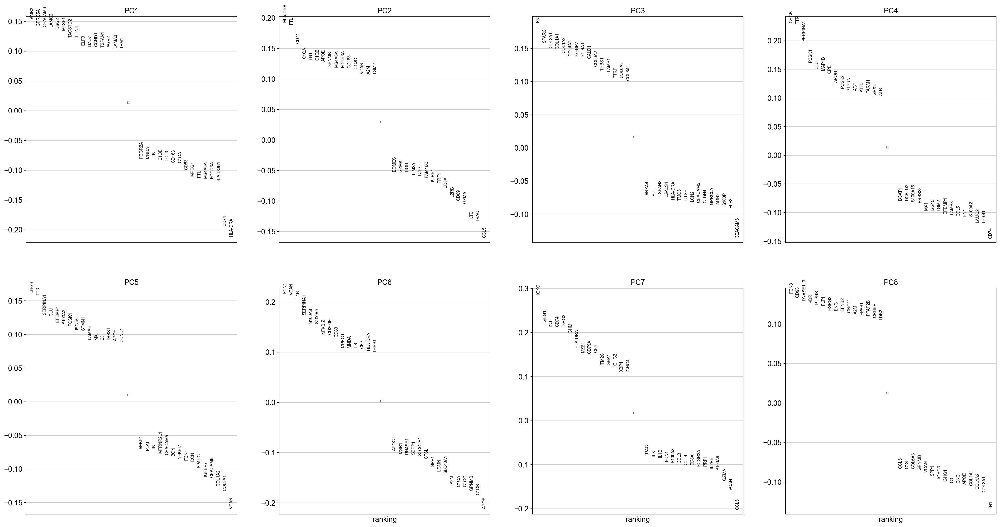

In [66]:
## Cluster 39 is high in mitochondrial genes
## Removal of cluster 32 removes mitochondrial content in PC3
sc.set_figure_params(figsize=(8, 8))

sc.pl.pca_loadings(scp1644_trim, components='1,2,3,4,5,6,7,8')
sc.pl.pca_loadings(scp1644_filter, components='1,2,3,4,5,6,7,8')

In [74]:
print(scp1644_filter[scp1644_filter.obs['Coarse_Cell_Annotations'] == 'Tumor'].shape[0]-197)

7656


In [75]:
filter_savepoint = 'scp1644_filter_savepoint.h5ad'
scp1644_filter.write_h5ad(str(flipcrow.paths.DATA_PATH / "SCP1644" / filter_savepoint))
# scp1644_filter = ad.read_h5ad(str(flipcrow.paths.DATA_PATH / "SCP1644" / filter_savepoint))

In [ ]:
# sc.pl.clustermap(scp1644_trim)

In [469]:
single_cell_data = scp1644_filter

def pseudobulk_leiden_subgroup(single_cell_data: ad.AnnData, subgroup: str = 'donor_ID'):
    # pseudobulk code
    adpb_buf = []
    for clust_id in single_cell_data.obs.leiden.unique():
    
        grpid_buf = []
        pb_counts_buf = []
        pb_n_cells_buf = []
        for grpid, grp in single_cell_data[single_cell_data.obs.leiden == str(clust_id), :].obs.groupby('donor_ID'):
            grpid_buf.append(grpid)
            pb_counts_buf.append(single_cell_data[grp.index, :].layers['trimmed_counts'].sum(axis=0))
            pb_n_cells_buf.append(len(grp.index))
        adpb = ad.AnnData(
            pd.DataFrame(pb_counts_buf, columns=single_cell_data.var_names),
            obs={'n_cells': pb_n_cells_buf},
        )
        adpb.obs['leiden'] = clust_id
        adpb.obs['donor_ID'] = grpid_buf
        
        adpb.obs_names = [f"{x}:{y}" for x, y in zip(np.ones(len(grpid_buf), dtype=int)*int(clust_id), grpid_buf)]
        
        adpb_buf.append(adpb)
    
    adpb_all = ad.concat(adpb_buf)
    
    # mitochondrial genes
    adpb_all.var['mt'] = adpb_all.var_names.str.startswith(("MT-"))
    
    sc.pp.calculate_qc_metrics(
        adpb_all, 
        qc_vars=["mt"], #, "ribo", "hb"], 
        inplace=True, 
        percent_top=[20], 
        log1p=False,
    )
    
    adpb_all.layers['trimmed_counts'] = adpb_all.to_df().loc[adpb_all.obs_names, :]
    # sc.pp.scrublet(adpb_all)
    sc.pp.normalize_total(adpb_all, target_sum=10000, inplace=True)
    sc.pp.log1p(adpb_all, copy=False)

    return adpb_all



In [470]:
adpb_test = pseudobulk_leiden_subgroup(scp1644_filter)

In [472]:
print(adpb_test.obs)

               n_cells leiden    donor_ID  n_genes_by_counts  total_counts  pct_counts_in_top_20_genes  total_counts_mt  pct_counts_mt
20:PANFR0383         2     20   PANFR0383               4774     15333.000                      13.552          501.000          3.267
20:PANFR0473        11     20   PANFR0473               8424     44098.000                      14.622         2789.000          6.325
20:PANFR0489         1     20   PANFR0489                782      1320.000                      18.030           17.000          1.288
20:PANFR0489R       45     20  PANFR0489R              13040    481904.000                      12.113        30250.000          6.277
20:PANFR0543         5     20   PANFR0543               8496     64108.000                      16.432         3282.000          5.119
...                ...    ...         ...                ...           ...                         ...              ...            ...
45:PANFR0593       103     45   PANFR0593              